In [3]:
import sys
import numpy as np
import spectral as sp
import matplotlib as mpl
import matplotlib.pyplot as plt
import scipy
import torch

sys.path.append('../')
from preprocessing import *
from extinctions import *
from plotting_parameters import *

In [4]:
bands_range = [601,900]

extinction_dict = get_extinctions(bands_range)
cyt_c_ox = extinction_dict["cyt_c_ox"]
cyt_c_red = extinction_dict["cyt_c_red"]
cyt_b_ox = extinction_dict["cyt_b_ox"]
cyt_b_red = extinction_dict["cyt_b_red"]
cyt_oxi_ox = extinction_dict["cyt_oxi_ox"]
cyt_oxi_red = extinction_dict["cyt_oxi_red"]
hb = extinction_dict["hb"]
hbo2 = extinction_dict["hbo2"]
water = extinction_dict["water"]
fat = extinction_dict["fat"]
specular = np.ones_like(water)

# # Plot the extinctions
# fig, axs = plt.subplots(2,3, figsize=(10,5))   
# for name, extinction in extinction_dict.items():
#     if "cyt_c" in name:
#         axs[0,0].plot(band_centers, extinction, label=name)
#     elif "cyt_b" in name: 
#         axs[0,1].plot(band_centers, extinction, label=name)
#     elif "cyt_oxi" in name: 
#         axs[0,2].plot(band_centers, extinction, label=name)
#     elif name == "hb":
#         axs[1,0].plot(band_centers, extinction, label=name)
#     elif name == "hbo2":
#         axs[1,0].plot(band_centers, extinction, label=name)
#     elif name == "water":
#         axs[1,1].plot(band_centers, extinction, label=name)
#     elif name == "fat":
#         axs[1,2].plot(band_centers, extinction, label=name)
# axs[0,0].set_title("Cyt c")
# axs[0,1].set_title("Cyt b")
# axs[0,2].set_title("Cyt oxi")
# axs[1,0].set_title("Hemoglobin")
# axs[1,1].set_title("Water")
# axs[1,2].set_title("Fat")
# axs[0,0].legend()
# axs[0,1].legend()
# axs[0,2].legend()
# axs[1,0].legend()
# plt.tight_layout()


# remove cytochrome difference spectra as they are not needed for helicoid
_ = extinction_dict.pop("cyt_c_diff")
_ = extinction_dict.pop("cyt_b_diff")
_ = extinction_dict.pop("cyt_oxi_diff")

/home/martin_ivan/anaconda3/envs/thesis/lib/python3.10/site-packages/spectral/io/envi.py:175: UserWarning: Parameters with non-lowercase names encountered and converted to lowercase. To retain source file parameter name capitalization, set spectral.settings.envi_support_nonlowercase_params to True.
  warnings.warn(msg)
/tmp/ipykernel_855477/2647430208.py:20: RuntimeWarning: invalid value encountered in log
  absorbance = -np.log(img_smooth)


Text(0.5, 0.98, 'Absorbance image')

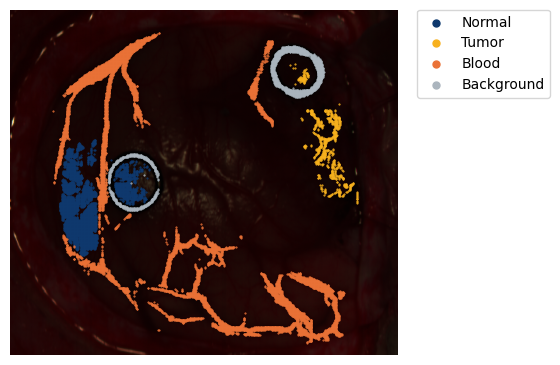

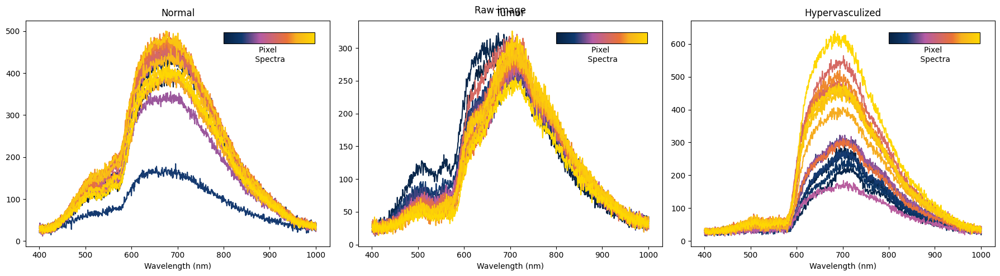

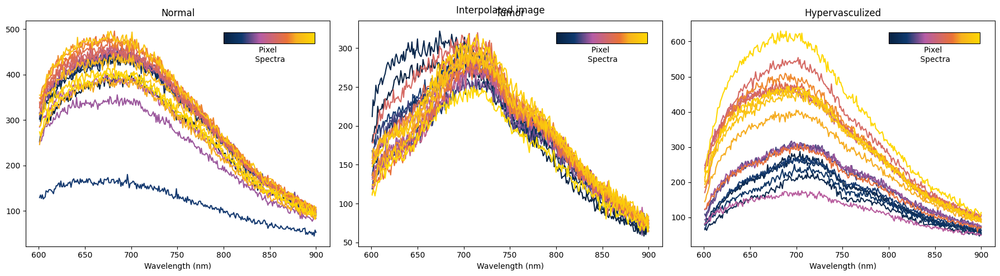

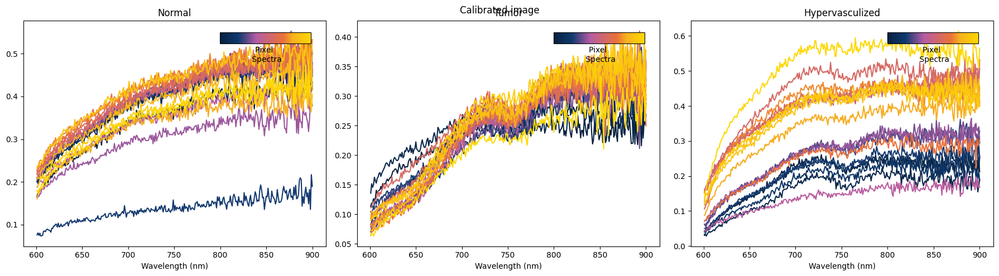

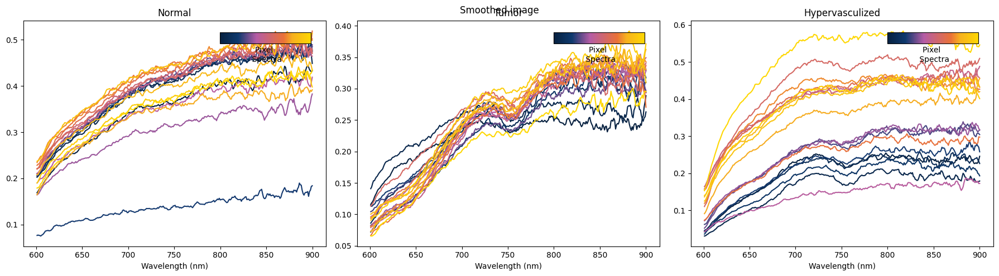

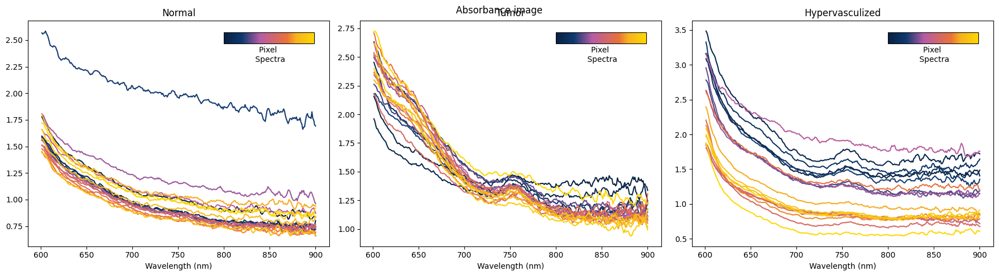

In [5]:
data_folder = "../../datasets/helicoid/012-01"
class_labels = ["Not labled", "Normal", "Tumor", "Blood", "Background"]
class_colors = ["white", tum_blue_dark_2, tum_orange, tum_red, tum_grey_5]

# Load the sp data
img = sp.open_image(data_folder + "/raw.hdr")
white_ref = sp.open_image(data_folder + "/whiteReference.hdr")
dark_ref = sp.open_image(data_folder + "/darkReference.hdr")
gt_map = sp.open_image(data_folder + "/gtMap.hdr")

plot_img(img, gt_map, class_labels, class_colors, figsize=(5,5), legend=True)


img_interp, band_centers = bands_lin_interpolation(img, img.bands.centers, bands_range)
white_ref_interp, _ = bands_lin_interpolation(white_ref, img.bands.centers, bands_range)
dark_ref_interp, _ = bands_lin_interpolation(dark_ref, img.bands.centers, bands_range)
img_calib = calibrate_img(img_interp, white_ref_interp, dark_ref_interp)
img_smooth = smooth_spectral(img_calib, 5)
# img_calib_norm = img_calib / np.linalg.norm(img_calib, axis=(0,1), keepdims=True)
absorbance = -np.log(img_smooth)

fig, axs = plot_class_spectra(img, gt_map, nspectr=20, bands=img.bands.centers)
fig.suptitle("Raw image")
fig, axs = plot_class_spectra(img_interp, gt_map, nspectr=20, bands=band_centers)
fig.suptitle("Interpolated image")
fig, axs = plot_class_spectra(img_calib, gt_map, nspectr=20, bands=band_centers)
fig.suptitle("Calibrated image")
fig, axs = plot_class_spectra(img_smooth, gt_map, nspectr=20, bands=band_centers)
fig.suptitle("Smoothed image")
fig, axs = plot_class_spectra(absorbance, gt_map, nspectr=20, bands=band_centers)
fig.suptitle("Absorbance image")

In [6]:
def LMM(M, abs, endmember_labels=None, plot=False):
    M_inv = np.linalg.pinv(M)

    c = np.einsum("ij,klj->kli", M_inv, abs)

    if plot:
        N = c.shape[2]
        if N == 1:
            plt.figure()
            plt.imshow(c[:,:,0], cmap="gray")
            return
        fig, axs = plt.subplots(1,N, figsize=(15,5))
        for i in range(N):
            axs[i].imshow(c[:,:,i], cmap="gray")
            axs[i].set_title(endmember_labels[i])
        plt.tight_layout()

    return c

def cosine_similarity(abs, spectr):
    return np.einsum("ijk,k->ij", abs, spectr) / (np.linalg.norm(abs, axis=2) * np.linalg.norm(spectr))

In [46]:
def project_lin_iterative(abs, endmembers_proj, endmembers_unmix, device="cpu"):
    '''
    Project the image onto the subspace orthogonal to the spectra.
    input:
        img: image to project, shape (...,k) where k is the number of bands and ... are the spatial or time dimensions
        endmembers: endmember spectra, shape (n, k), where n is the number of endmembers
    output:
        projected image perpendicular to all spectra, np.array
        projected endmembers_unmix, np.array
    '''

    n,k = endmembers_proj.shape

    # convert to torch tensors
    abs = torch.from_numpy(abs).to(device).float()
    endmembers_proj = torch.from_numpy(endmembers_proj).to(device).float()
    endmembers_unmix = torch.from_numpy(endmembers_unmix).to(device).float()

    for i in range(n):
        # construct projection matrix onto orthogonal complement of current endmember
        endmember_proj = endmembers_proj[i,:]

        print(endmember_proj[:5])
        print(endmembers_unmix[:3,:3])
        print(endmembers_proj[:3,:3])
        print()

        P = torch.eye(k).to(device) - torch.outer(endmember_proj, endmember_proj)/torch.dot(endmember_proj, endmember_proj)
        # apply mapping to data
        abs = torch.einsum('ik,...k->...i', P, abs)
        endmembers_unmix = torch.einsum('ik,nk->ni', P, endmembers_unmix)
        endmembers_proj = torch.einsum('ik,nk->ni', P, endmembers_proj)

    # convert back to numpy array
    abs_proj = abs.cpu().numpy()
    endmembers_unmix_proj = endmembers_unmix.cpu().numpy()

    return abs_proj, endmembers_unmix_proj


def project_lin_fast(abs, endmembers_proj, endmembers_unmix, device="cpu"):
    '''
    Project the image onto the subspace orthogonal to the spectra.
    input:
        abs: absorbance array to project, shape (...,k) where k is the number of bands and ... are the spatial or time dimensions
        endmembers: endmember spectra, shape (n, k), where n is the number of endmembers
    output:
        projected absorbance array perpendicular to all spectra, np.array
        projected endmembers_unmix, np.array
    '''

    # construct projection matrix onto orthogonal complement of endmembers_proj
    endmembers_proj_orth = scipy.linalg.orth(endmembers_proj.T).T
    P = np.eye(endmembers_proj.shape[1]) - endmembers_proj_orth.T @ endmembers_proj_orth

    # convert to torch tensors
    P = torch.from_numpy(P).to(device).float()
    abs = torch.from_numpy(abs).to(device).float()
    endmembers_unmix = torch.from_numpy(endmembers_unmix).to(device).float()

    # project data
    abs_proj = torch.einsum('ik,...k->...i', P, abs).cpu().numpy()
    endmembers_unmix_proj = torch.einsum('ik,nk->ni', P, endmembers_unmix).cpu().numpy()

    return abs_proj, endmembers_unmix_proj

def distance_after_proj_iterative(absorption, endmember_array, idx):
    endmembers_unmix = endmember_array[idx,:][None,:]
    endmembers_proj = np.delete(endmember_array, idx, axis=0)
    absorption_proj, endmembers_unmix_proj = project_lin_iterative(absorption, endmembers_proj, endmembers_unmix, device="cuda")
    d = cosine_similarity(absorption_proj, endmembers_unmix_proj.squeeze())
    return d

def distance_after_proj_fast(absorption, endmember_array, idx):
    endmembers_unmix = endmember_array[idx,:][None,:]
    endmembers_proj = np.delete(endmember_array, idx, axis=0)
    absorption_proj, endmembers_unmix_proj = project_lin_fast(absorption, endmembers_proj, endmembers_unmix, device="cuda")
    d = cosine_similarity(absorption_proj, endmembers_unmix_proj.squeeze())
    return d

In [47]:
# wrong because the bilinear endmembers are not projected correctly
def project_bilin_iterative(abs, endmembers, device="cpu"):

    n,k = endmembers.shape
    abs = torch.from_numpy(abs).to(device).float()
    endmembers = torch.from_numpy(endmembers).to(device).float()

    for i in range(n):
        for j in range(i,n):

            endmember_proj_bilin = endmembers[i,:] * endmembers[j,:]
            P = torch.eye(k).to(device) - torch.outer(endmember_proj_bilin, endmember_proj_bilin)/ torch.dot(endmember_proj_bilin, endmember_proj_bilin)
            
            # apply mapping to data
            abs = torch.einsum('ik,...k->...i', P, abs)
            endmembers = torch.einsum('ik,nk->ni', P, endmembers)
            

    # convert back to numpy array
    abs_proj = abs.cpu().numpy()
    endmembers_proj = endmembers.cpu().numpy()

    return abs_proj, endmembers_proj


def project_bilin_fast(abs, endmembers, device="cpu"):
    n,k = endmembers.shape
    endmembers_bilin = np.zeros((int(n*(n+1)/2), k))
    idx = 0
    for i in range(n):
        for j in range(i,n):
            endmembers_bilin[idx,:] = endmembers[i,:] * endmembers[j,:]
            endmembers_bilin[idx,:] /= np.linalg.norm(endmembers_bilin[idx,:])
            idx += 1

    # construct projection matrix onto orthogonal complement of endmembers_bilin
    endmembers_bilin_orth = scipy.linalg.orth(endmembers_bilin.T).T
    P = np.eye(k) - endmembers_bilin_orth.T @ endmembers_bilin_orth

    # convert to torch tensors
    P = torch.from_numpy(P).to(device).float()
    endmembers = torch.from_numpy(endmembers).to(device).float()
    abs = torch.from_numpy(abs).to(device).float()

    # project data
    abs_proj = torch.einsum('ik,...k->...i', P, abs).cpu().numpy()
    endmembers_proj = torch.einsum('ik,nk->ni', P, endmembers).cpu().numpy()

    return abs_proj, endmembers_proj

#### Cosine similarity without projection

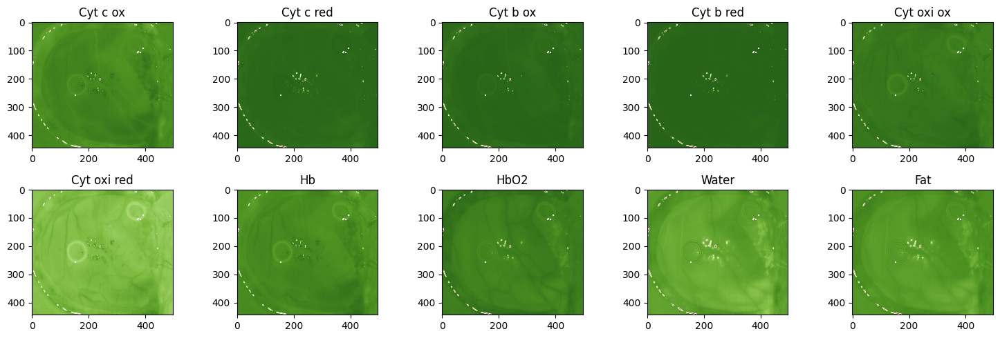

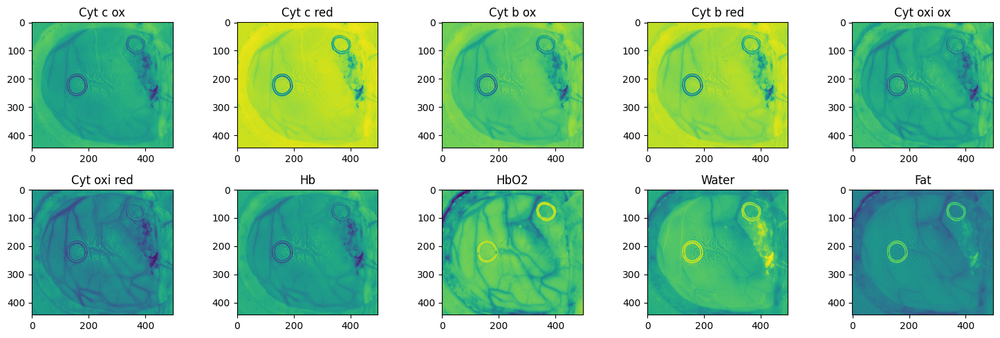

In [9]:
endmember_labels = ["Cyt c ox", "Cyt c red", "Cyt b ox", "Cyt b red", "Cyt oxi ox", "Cyt oxi red", "Hb", "HbO2", "Water", "Fat", "specular"]
extinction_array = np.vstack([extinction_dict[key] for key in extinction_dict.keys()])

fig, axs = plt.subplots(2,5, figsize=(15,5))
for i in range(10):
    d = cosine_similarity(absorbance, extinction_array[i,:])
    axs[i//5,i%5].imshow(d, cmap='PiYG')
    axs[i//5,i%5].set_title(endmember_labels[i])
plt.tight_layout()

fig, axs = plt.subplots(2,5, figsize=(15,5))
for i in range(10):
    d = cosine_similarity(img_smooth, extinction_array[i,:])
    axs[i//5,i%5].imshow(d)
    axs[i//5,i%5].set_title(endmember_labels[i])
plt.tight_layout()

In [19]:
n,k = extinction_array.shape
extinction_array_bilinear = np.zeros((int(n*(n+1)/2), k))
idx = 0
for i in range(n):
    for j in range(i,n):
        extinction_array_bilinear[idx,:] = extinction_array[i,:] * extinction_array[j,:]
        idx += 1

extinction_array_lqm = np.vstack([extinction_array, extinction_array_bilinear])
print(extinction_array_lqm.shape)

(65, 300)


### Projection (1st order) + Cosine similarity

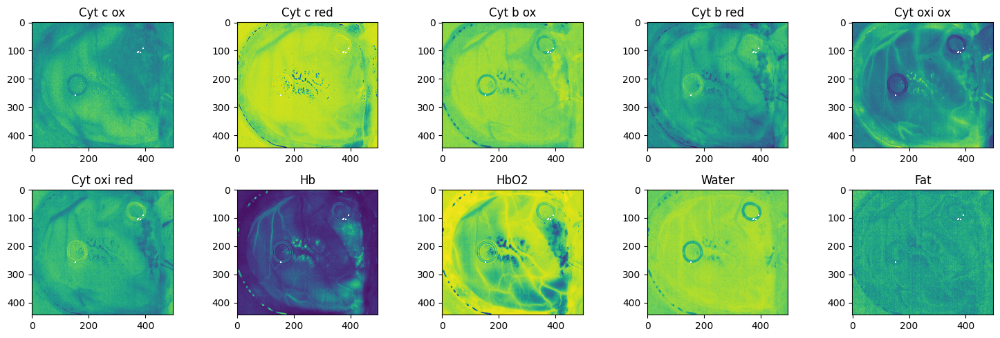

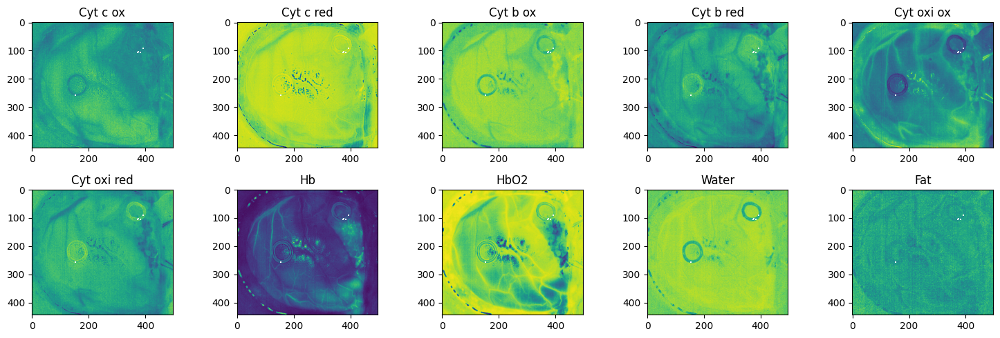

In [32]:
fig, axs = plt.subplots(2,5, figsize=(15,5))
for i in range(10):
    d = distance_after_proj_iterative(absorbance, extinction_array, i)
    axs[i//5,i%5].imshow(d)
    axs[i//5,i%5].set_title(endmember_labels[i])
plt.tight_layout()

fig, axs = plt.subplots(2,5, figsize=(15,5))
for i in range(10):
    d = distance_after_proj_fast(absorbance, extinction_array, i)
    # d = scipy.ndimage.gaussian_filter(d, sigma=2)
    # axs[i//5,i%5].imshow(d, cmap='PiYG')
    axs[i//5,i%5].imshow(d)
    axs[i//5,i%5].set_title(endmember_labels[i])
plt.tight_layout()

tensor([14.4344, 13.7431, 13.0686, 12.4112, 11.9293], device='cuda:0')
tensor([[3.7993, 3.7072, 3.6151],
        [0.8750, 0.8704, 0.8658],
        [6.8109, 6.7237, 6.6366]], device='cuda:0')
tensor([[14.4344, 13.7431, 13.0686],
        [ 3.3243,  3.2266,  3.1298],
        [25.8762, 24.9260, 23.9918]], device='cuda:0')

tensor([-1.0546, -0.9425, -0.8347, -0.7394, -0.6684], device='cuda:0')
tensor([[-1.7093, -1.5376, -1.3723],
        [-0.9145, -0.8334, -0.7544],
        [-4.5895, -4.1306, -3.6851]], device='cuda:0')
tensor([[ 0.0000e+00,  5.2452e-06,  5.2452e-06],
        [-1.0546e+00, -9.4251e-01, -8.3473e-01],
        [-3.3921e+00, -2.9405e+00, -2.5072e+00]], device='cuda:0')

tensor([-1.3514, -1.1167, -0.8920, -0.6616, -0.5750], device='cuda:0')
tensor([[-0.2412, -0.2255, -0.2103],
        [ 0.7360,  0.6417,  0.5520],
        [ 1.1673,  1.0144,  0.8716]], device='cuda:0')
tensor([[-6.0854e-07,  4.7013e-06,  4.7635e-06],
        [ 2.3842e-07, -5.9605e-08,  8.9407e-08],
        [-1.351

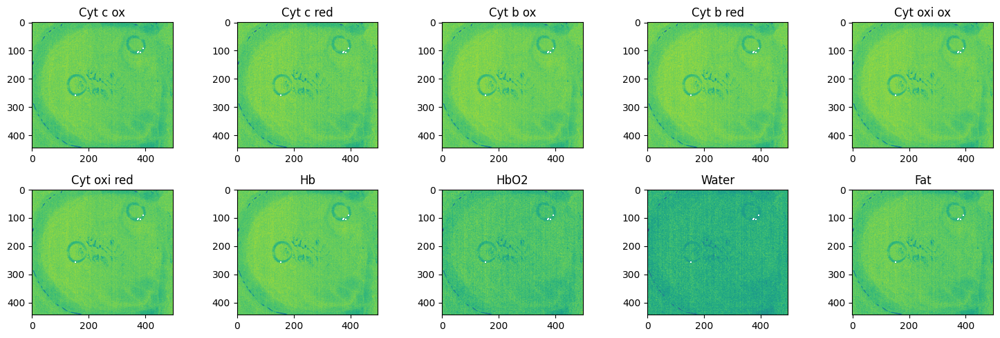

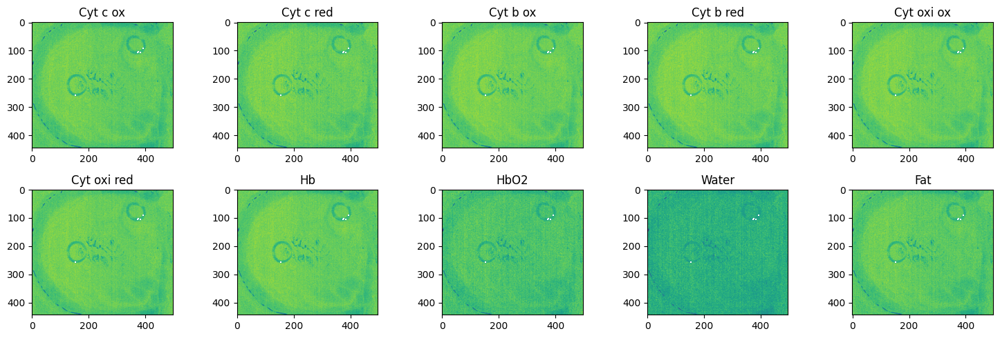

In [45]:
fig, axs = plt.subplots(2,5, figsize=(15,5))
absorbance_proj, endmembers_unmix_proj = project_lin_iterative(absorbance, endmembers_proj=extinction_array_bilinear, endmembers_unmix=extinction_array , device="cuda")
for i in range(10):
    d = cosine_similarity(absorbance_proj, endmembers_unmix_proj[i,:])
    axs[i//5,i%5].imshow(d)
    axs[i//5,i%5].set_title(endmember_labels[i])
plt.tight_layout()


fig, axs = plt.subplots(2,5, figsize=(15,5))
absorbance_proj, endmembers_unmix_proj = project_lin_fast(absorbance, endmembers_proj=extinction_array_bilinear, endmembers_unmix=extinction_array , device="cuda")
for i in range(10):
    d = cosine_similarity(absorbance_proj, endmembers_unmix_proj[i,:])
    axs[i//5,i%5].imshow(d)
    axs[i//5,i%5].set_title(endmember_labels[i])
plt.tight_layout()

### Projection (2nd order) + Cosine similarity

tensor([14.4344, 13.7431, 13.0686, 12.4112, 11.9293], device='cuda:0')
tensor([[3.7993, 3.7072, 3.6151],
        [0.8750, 0.8704, 0.8658],
        [6.8109, 6.7237, 6.6366]], device='cuda:0')
tensor([], device='cuda:0', size=(0, 3))

tensor([1.5632, 1.2815, 1.0353, 0.8250, 0.6863], device='cuda:0')
tensor([[-1.7093, -1.5376, -1.3723],
        [-0.9145, -0.8334, -0.7544],
        [-4.5895, -4.1306, -3.6851]], device='cuda:0')
tensor([], device='cuda:0', size=(0, 3))

tensor([25.4521, 19.0505, 14.0131, 10.1227,  7.8331], device='cuda:0')
tensor([[ -2.4755,  -2.1657,  -1.8797],
        [ -2.8562,  -2.4251,  -2.0404],
        [-10.2816,  -8.7966,  -7.4548]], device='cuda:0')
tensor([], device='cuda:0', size=(0, 3))

tensor([0.2087, 0.0209, 0.4208, 0.8518, 1.0573], device='cuda:0')
tensor([[ 0.3712, -0.0350, -0.3125],
        [ 0.2168, -0.1250, -0.3485],
        [ 0.6810, -0.5913, -1.4192]], device='cuda:0')
tensor([], device='cuda:0', size=(0, 3))

tensor([-2.0132,  0.1818,  2.6723,  5.9362

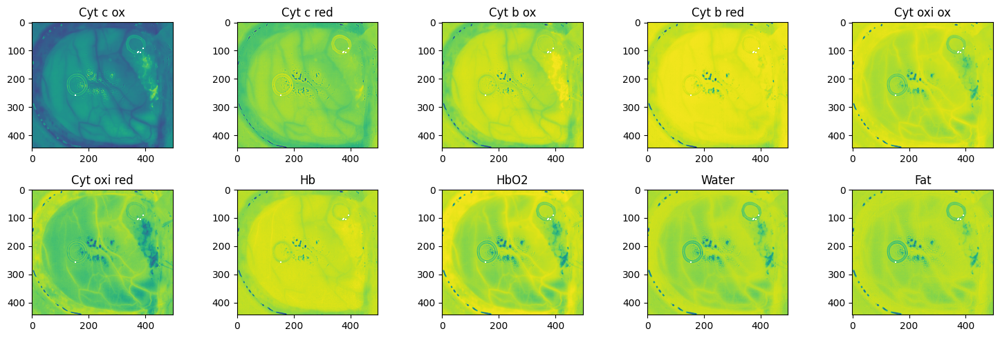

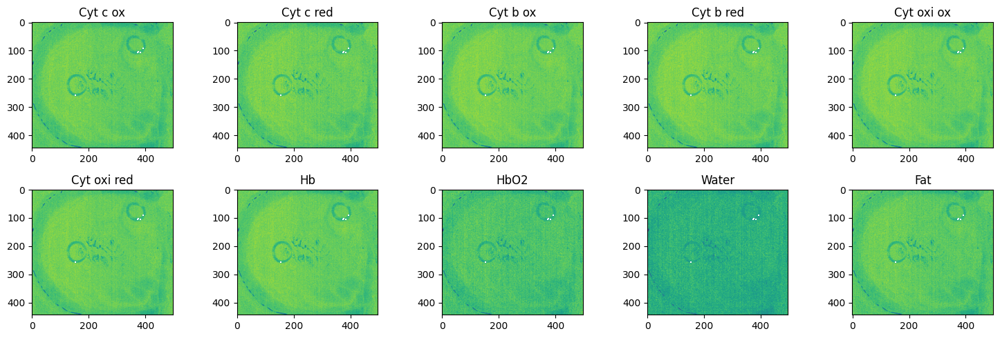

In [44]:
fig, axs = plt.subplots(2,5, figsize=(15,5))
absorbance_proj, endmembers_unmix_proj = project_bilin_iterative(absorbance, extinction_array, device="cuda")
for i in range(10):
    d = cosine_similarity(absorbance_proj, endmembers_unmix_proj[i,:])
    axs[i//5,i%5].imshow(d)
    axs[i//5,i%5].set_title(endmember_labels[i])
plt.tight_layout()


fig, axs = plt.subplots(2,5, figsize=(15,5))
absorbance_proj, endmembers_unmix_proj = project_bilin_fast(absorbance, extinction_array, device="cuda")
for i in range(10):
    d = cosine_similarity(absorbance_proj, endmembers_unmix_proj[i,:])
    axs[i//5,i%5].imshow(d)
    axs[i//5,i%5].set_title(endmember_labels[i])
plt.tight_layout()

### Projection (1st + 2nd order) + Projection

10 300


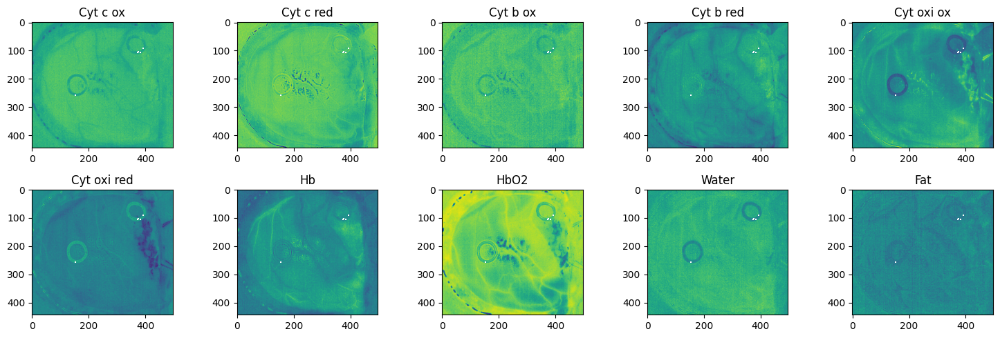

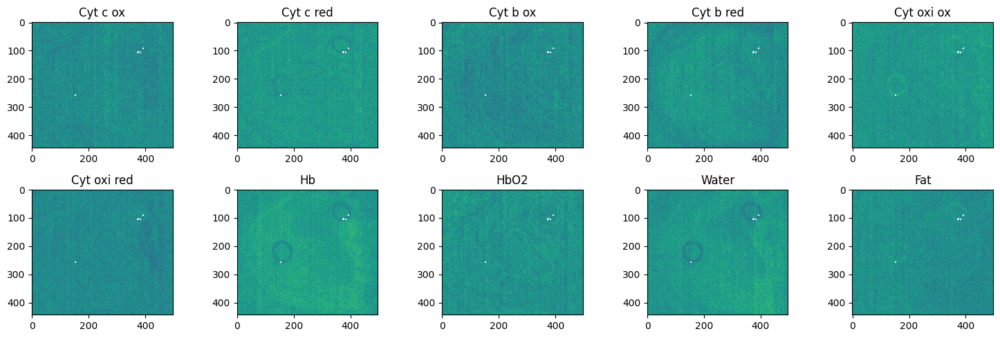

In [50]:
fig, axs = plt.subplots(2,5, figsize=(15,5))
endmember_labels = ["Cyt c ox", "Cyt c red", "Cyt b ox", "Cyt b red", "Cyt oxi ox", "Cyt oxi red", "Hb", "HbO2", "Water", "Fat", "specular"]
extinction_dict_keys = list(extinction_dict.keys())

extinction_array = np.vstack([extinction_dict[key] for key in extinction_dict.keys()])
absorption_proj, endmembers_unmix_proj = project_bilin_iterative(absorbance, extinction_array, device="cuda")

for i in range(10):
    d = distance_after_proj_fast(absorption_proj, endmembers_unmix_proj, i)
    axs[i//5,i%5].imshow(d)
    axs[i//5,i%5].set_title(endmember_labels[i])
plt.tight_layout()


fig, axs = plt.subplots(2,5, figsize=(15,5))
endmember_labels = ["Cyt c ox", "Cyt c red", "Cyt b ox", "Cyt b red", "Cyt oxi ox", "Cyt oxi red", "Hb", "HbO2", "Water", "Fat", "specular"]
extinction_dict_keys = list(extinction_dict.keys())

extinction_array = np.vstack([extinction_dict[key] for key in extinction_dict.keys()])
img_proj, endmembers_unmix_proj = project_bilin_fast(absorbance, extinction_array, device="cuda")

for i in range(10):
    d = distance_after_proj_fast(img_proj, endmembers_unmix_proj, i)
    axs[i//5,i%5].imshow(d)
    axs[i//5,i%5].set_title(endmember_labels[i])
plt.tight_layout()